## Import modules

In [1]:
import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
import session_info
session_info.show()

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)

## Function

In [4]:
def proportion(adata, key, groupby, invert_yaxis=True, key_toremove=None, group_toremove=None, bbox_to_anchor=(2, 0.5), legend_frameon=False):
    
    metadata = adata.obs
    groups = metadata[groupby].cat.categories
    
    if group_toremove==None:
        pass
    else:
        groups = [x for x in groups if x not in group_toremove]
    
    keys = metadata[key].cat.categories
    
    if key_toremove==None:
        pass
    else:
        keys = [x for x in keys if x not in key_toremove]
    
    percent_list = []
    
    for group in groups:
        each_meta = metadata[metadata[groupby]==group]
        
        if key_toremove==None:
            pass
        else:
            each_meta = each_meta[each_meta[key].isin(key_toremove)==False]
        
        percent_array = np.array([])
        for akey in keys:
            if len(each_meta[each_meta[key]==akey])>0:
                num = len(each_meta[each_meta[key]==akey])
                percent = num*100/len(each_meta)
                percent_array = np.append(percent_array, percent)
                del num, percent
            else:
                percent_array = np.append(percent_array, 0)
        percent_list.append(percent_array)
        del each_meta, percent_array
    
    # plot
    data = pd.DataFrame(percent_list)
    bottom = np.array([])
    left = data[0]-data[0]
    for i in range(len(keys)):
        plt.barh(groups, data[i], left=left)
        left = left + data[i]
    if invert_yaxis:
        plt.gca().invert_yaxis()
    plt.legend(keys, loc='right', bbox_to_anchor=bbox_to_anchor, frameon=legend_frameon)
    plt.xlabel('Proportion (%)')

## Directory

In [5]:
adata_dir = '/nfs/team205/heart/anndata_objects/8regions'

## Read in data

* batch_key: donor + nuclei_or_cells + kit_10x

In [6]:
adata = sc.read_h5ad(f'{adata_dir}/scVI/RNA_adult-8reg_scVI.h5ad')
adata

AnnData object with n_obs × n_vars = 684473 × 3063
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'donor_physical', 'donor_predicted', 'batch_key', '_scvi_batch', '_scvi_labels'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi', 'hvg'
    obsm: 'X_scVI', '_scvi_extra_continuous', 'latent_gene_encoding'
    layers: 'counts'

## Clustering, UMAP

In [7]:
%%time
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata, min_dist=0.2)
sc.tl.leiden(adata, resolution=1, key_added='leiden_scVI',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:05:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:15:34)
running Leiden clustering
    finished: found 32 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:35:08)


CPU times: user 1h 44min 45s, sys: 14min, total: 1h 58min 46s
Wall time: 55min 53s


In [10]:
adata.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI.h5ad')

In [ ]:
adata = sc.read_h5ad(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdbl.h5ad')
adata

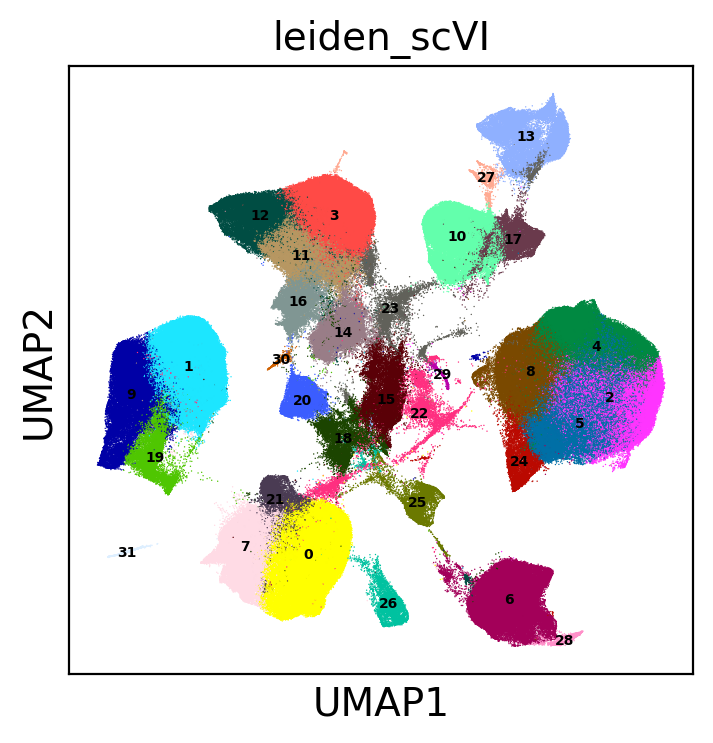

In [8]:
sc.pl.umap(adata, color=['leiden_scVI',], size=1, legend_loc='on data', legend_fontsize=5)

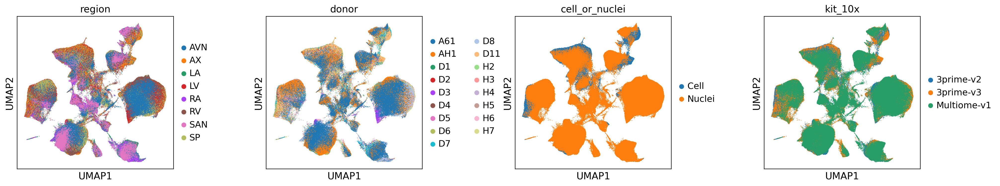

In [11]:
sc.pl.umap(adata, color=['region','donor','cell_or_nuclei','kit_10x'], size=2, wspace=0.45)

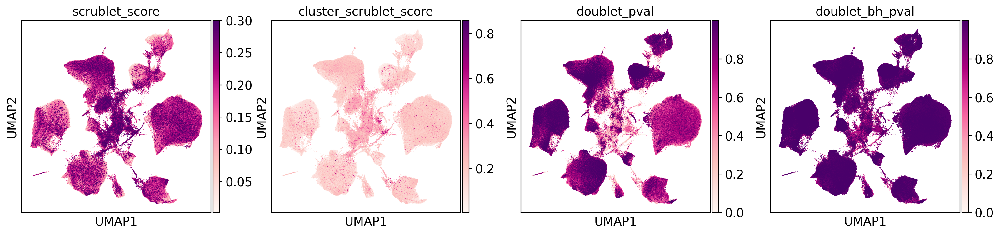

In [12]:
sc.pl.umap(adata, use_raw=True, color=['scrublet_score','cluster_scrublet_score','doublet_pval','doublet_bh_pval'], size=2, wspace=0.2, ncols=5)

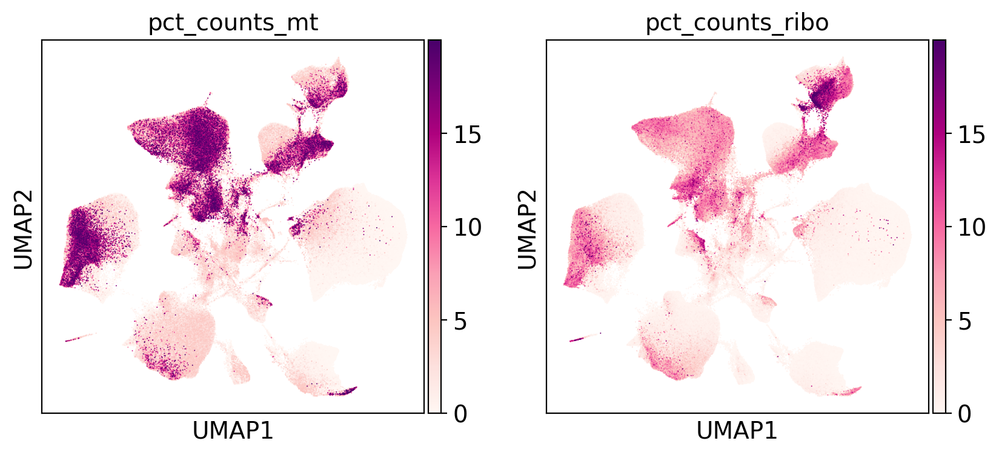

In [13]:
sc.pl.umap(adata, use_raw=True, color=['pct_counts_mt','pct_counts_ribo'], size=2, wspace=0.2, ncols=5)

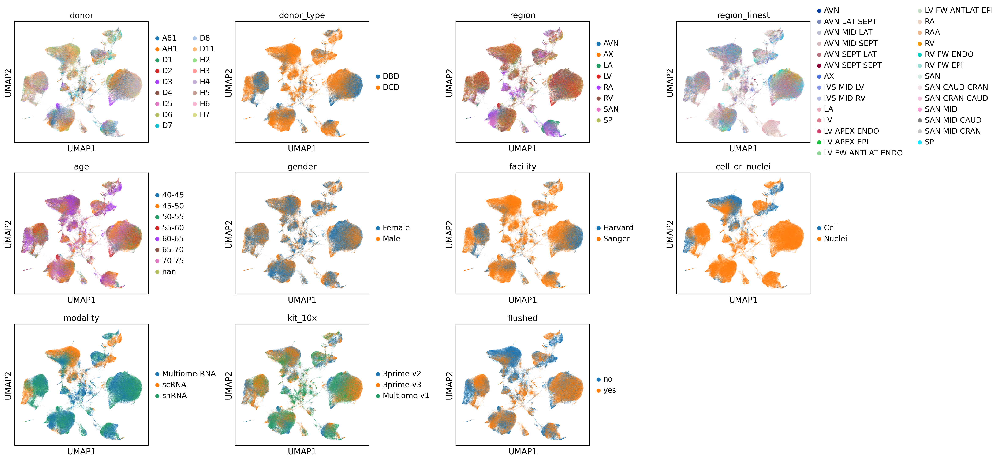

In [14]:
sc.pl.umap(adata, color=['donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed'], wspace=0.5)

## Annotate doublet-like clusters

In [9]:
# proportion of scrublet score > 0.2 per cluster
df=pd.crosstab(adata.obs['scrublet_score']>0.2,adata.obs['leiden_scVI']).T.copy()
df=df.apply(lambda x:x[True]/np.sum(x), axis=1)
df=df.sort_values(ascending=False)
df=pd.DataFrame(df)
df.rename(columns={0:'prop of scrubscore>0.2'})

### cluster 22,18,23,15,14 have more than 30% of scrublet score > 0.2 data point ### -> Doublet clusters

,prop of scrubscore>0.2
leiden_scVI,
22,0.486135
18,0.425029
23,0.414669
15,0.399782
14,0.371613
30,0.161060
27,0.129032
12,0.127592
26,0.121318


In [15]:
# proportion of the doublet cluster cell number
np.sum(adata.obs['leiden_scVI'].isin(['22','18','23','15','14']))/len(adata)

0.07938077908113249

In [16]:
# annotate doublet clusters
adata.obs['doublet_cls']='No'
doublet_b=adata.obs[adata.obs['leiden_scVI'].isin(['22','18','23','15','14'])].index
adata.obs.loc[doublet_b,'doublet_cls']='Yes'
adata.obs['doublet_cls'].value_counts()

No     630139
Yes     54334
Name: doublet_cls, dtype: int64

... storing 'doublet_cls' as categorical


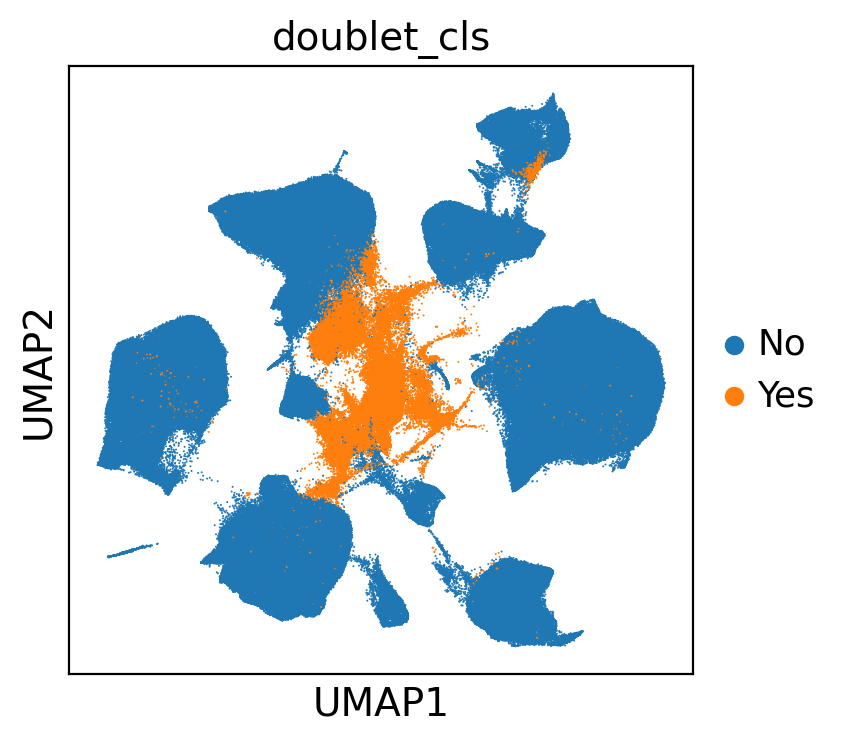

In [17]:
sc.pl.umap(adata, use_raw=True, color=['doublet_cls'], size=2, wspace=0.2, ncols=5)

In [19]:
adata.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI.h5ad')

In [ ]:
adata = sc.read_h5ad(f'{adata_dir}/scVI/RNA_adult-8reg_scVI.h5ad')
adata

## Remove doublet-clusters and re-UMAP and re-clustering

In [18]:
adata2 = adata[adata.obs['doublet_cls']=='No']
adata2

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


View of AnnData object with n_obs × n_vars = 630139 × 3063
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'donor_physical', 'donor_predicted', 'batch_key', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'doublet_cls'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi', 'hvg', 'neighbors', 'umap', 'leiden', 'leiden_scVI_colors', 'region_colors', 'donor_colors', 'cell_or_nuclei_colors', 'kit_10x_colors', 'd

In [20]:
del adata

In [21]:
%%time
sc.pp.neighbors(adata2, use_rep="X_scVI")
sc.tl.umap(adata2, min_dist=0.2)
sc.tl.leiden(adata2, resolution=2, key_added='leiden_scVI',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:14:03)
running Leiden clustering
    finished: found 48 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:27:43)


CPU times: user 1h 27min 53s, sys: 12min 13s, total: 1h 40min 6s
Wall time: 45min 55s


In [22]:
adata2.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdblcls.h5ad')

In [7]:
adata2 = sc.read_h5ad(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdblcls.h5ad')
adata2

AnnData object with n_obs × n_vars = 630139 × 3063
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'donor_physical', 'donor_predicted', 'batch_key', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'doublet_cls'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi', 'age_colors', 'cell_or_nuclei_colors', 'donor_colors', 'donor_type_colors', 'doublet_cls_colors', 'facility_colors', 'flushed_colors', 'gender_col

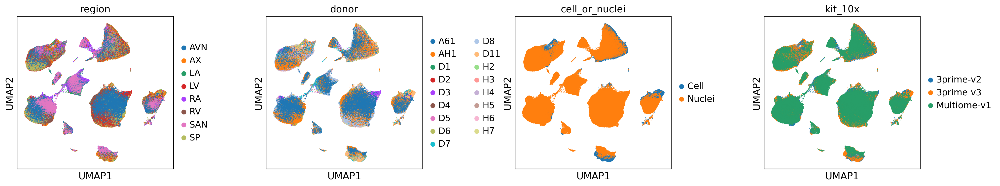

In [8]:
sc.pl.umap(adata2, color=['region','donor','cell_or_nuclei','kit_10x'], size=2, wspace=0.45)

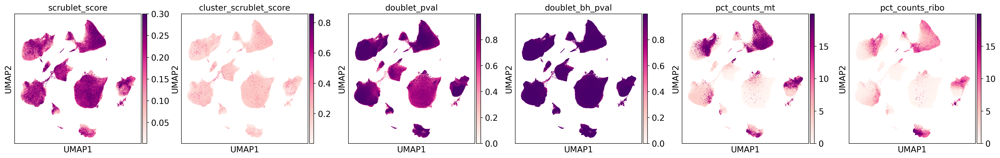

In [9]:
sc.pl.umap(adata2, color=['scrublet_score','cluster_scrublet_score','doublet_pval','doublet_bh_pval','pct_counts_mt','pct_counts_ribo'], size=2, wspace=0.2, ncols=6)

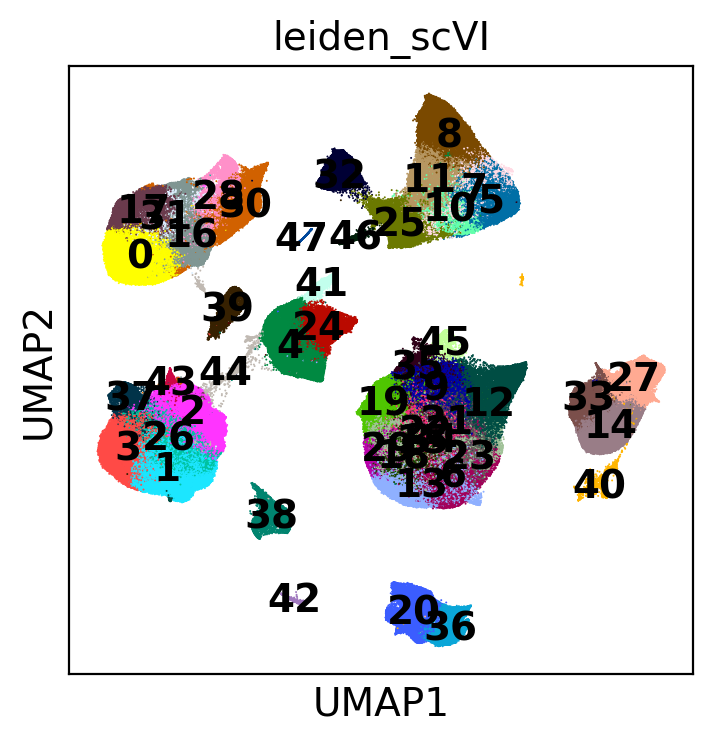

In [10]:
sc.pl.umap(adata2, color=['leiden_scVI'], size=2, wspace=0.2, ncols=6, legend_loc='on data')

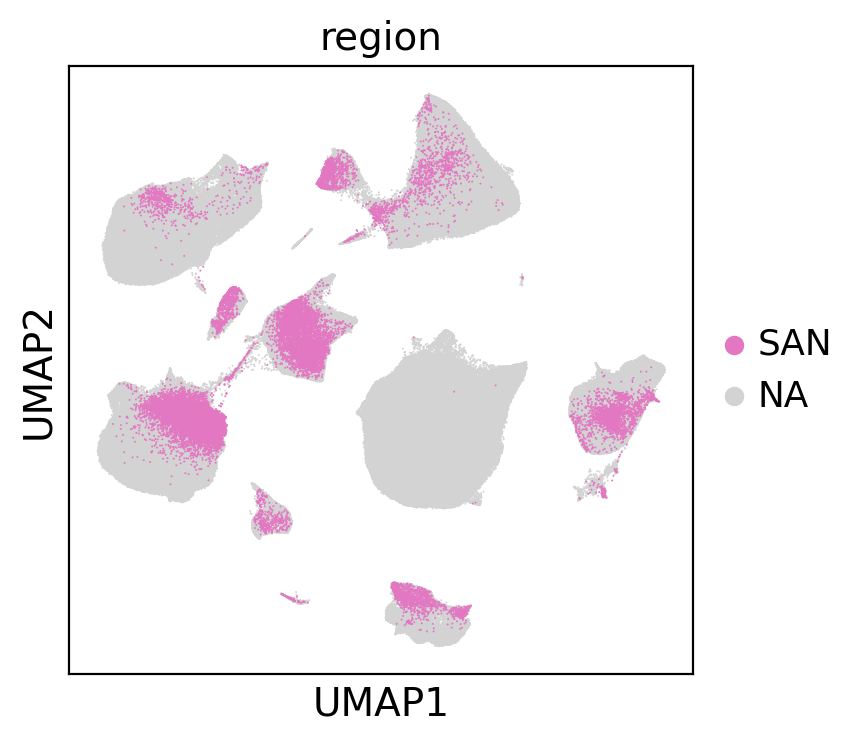

In [26]:
sc.pl.umap(adata2, color=['region'], groups='SAN',size=2, wspace=0.2, ncols=6)

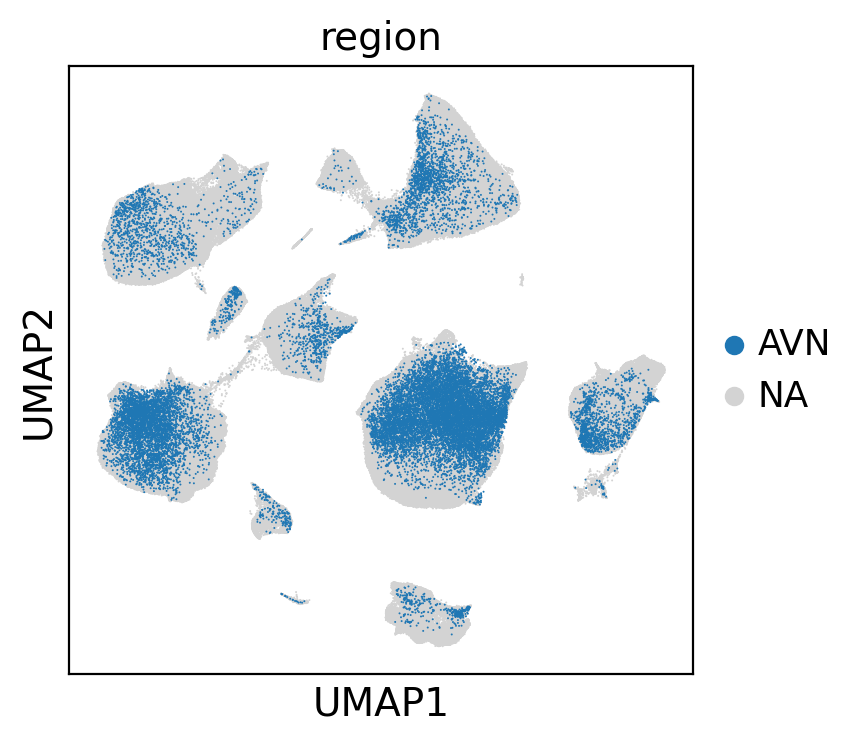

In [27]:
sc.pl.umap(adata2, color=['region'], groups='AVN',size=2, wspace=0.2, ncols=6)

In [11]:
# proportion of scrublet score > 0.2 per cluster
df=pd.crosstab(adata2.obs['scrublet_score']>0.2,adata2.obs['leiden_scVI']).T.copy()
df=df.apply(lambda x:x[True]/np.sum(x), axis=1)
df=df.sort_values(ascending=False)
df=pd.DataFrame(df)
df.rename(columns={0:'prop of scrubscore>0.2'})

### cluster 44 have more than 30% of scrublet score > 0.2 data point ### -> Doublet clusters

,prop of scrubscore>0.2
leiden_scVI,
44,0.487250
46,0.160732
35,0.150173
5,0.143230
39,0.121418
40,0.119870
8,0.117553
47,0.109375
7,0.107497


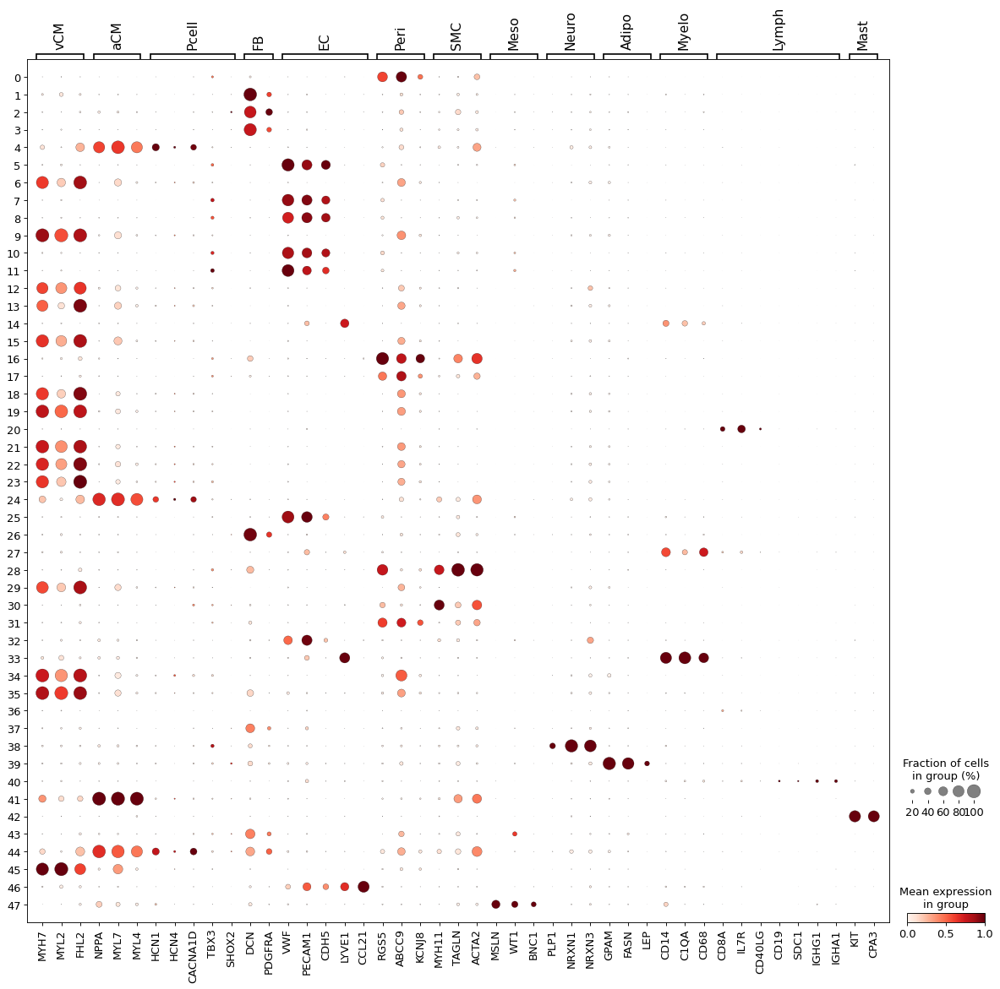

In [12]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)
genename_column='gene_name_multiome-2'

marker_genes_dict = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for k, v in marker_genes_dict.items():
    marker_genes_dict[k] = [x for x in v if x in list(adata2.raw.var[genename_column])]

sc.pl.dotplot(adata2, marker_genes_dict, 
              groupby='leiden_scVI',
              dendrogram=False,
              use_raw=True,
              gene_symbols=genename_column,
              standard_scale="var",
              color_map="Reds",
             # swap_axes=True
             )

In [13]:
##### Check cell states are not missing here compared with the previous object #####

ad = adata2[adata2.obs['leiden_scVI'].isin(['44'])==False]

# read
import pickle
def read_pkl(file):
    with open(file, "rb") as tf:
        obj = pickle.load(tf)
    
    return obj

cells_dict=read_pkl('/nfs/team205/kk18/data/anndata/cellstatenew_dict.pkl')

for c in cells_dict.keys():
    inters = set(ad.obs_names).intersection(cells_dict[c])
    cells_dict[c]=len(inters)/len(cells_dict[c])
    
sorted(cells_dict.items(),key=lambda item: item[1])

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


[('EC9_FB-like', 0.47368421052631576),
 ('PC4_CMC-like', 0.49195710455764075),
 ('NC4', 0.5263157894736842),
 ('Mast', 0.5654008438818565),
 ('CD8+T_trans', 0.6326845844918134),
 ('CD8+T_em', 0.6773279352226721),
 ('CD4+T_act', 0.6876701672500972),
 ('NC3', 0.6923076923076923),
 ('NC1', 0.7219366605869674),
 ('aCM5', 0.7258064516129032),
 ('EC1_cap', 0.7348957159668494),
 ('B_plasma', 0.7363896848137536),
 ('CD8+T_cytox', 0.7404737384140062),
 ('CD16+Mo_cycling', 0.7674418604651163),
 ('NK_CD16hi', 0.7713979482468228),
 ('MoMP_cycling', 0.7794117647058824),
 ('CD16+Mo', 0.7862647325475974),
 ('Adip4', 0.7887323943661971),
 ('CD14+Mo', 0.7906155398587286),
 ('NCsan', 0.8),
 ('LYVE1+IGF1-MP', 0.8029912325941206),
 ('LYVE1+IGF1-MP_cycling', 0.804005722460658),
 ('cDC', 0.8109647561409754),
 ('MAIT-like', 0.8111888111888111),
 ('EC4_immune', 0.8114261621165806),
 ('NK_CD56hi', 0.816688567674113),
 ('MoMP', 0.82671272308578),
 ('EC8_ln', 0.8336397058823529),
 ('aCM4', 0.8352470424495476),
 

In [14]:
##### Check cell states are not missing here compared with the previous object #####

ad = adata2.copy()

# read
import pickle
def read_pkl(file):
    with open(file, "rb") as tf:
        obj = pickle.load(tf)
    
    return obj

cells_dict=read_pkl('/nfs/team205/kk18/data/anndata/cellstatenew_dict.pkl')

for c in cells_dict.keys():
    inters = set(ad.obs_names).intersection(cells_dict[c])
    cells_dict[c]=len(inters)/len(cells_dict[c])
    
sorted(cells_dict.items(),key=lambda item: item[1])

[('EC9_FB-like', 0.47368421052631576),
 ('PC4_CMC-like', 0.49553172475424484),
 ('Mast', 0.5654008438818565),
 ('NC4', 0.5789473684210527),
 ('CD8+T_trans', 0.6326845844918134),
 ('CD8+T_em', 0.6773279352226721),
 ('CD4+T_act', 0.6876701672500972),
 ('NC3', 0.6923076923076923),
 ('NC1', 0.7219366605869674),
 ('EC1_cap', 0.7348957159668494),
 ('B_plasma', 0.7363896848137536),
 ('CD8+T_cytox', 0.7404737384140062),
 ('CD16+Mo_cycling', 0.7674418604651163),
 ('NK_CD16hi', 0.7713979482468228),
 ('MoMP_cycling', 0.7794117647058824),
 ('CD16+Mo', 0.7862647325475974),
 ('Adip4', 0.7887323943661971),
 ('CD14+Mo', 0.7906155398587286),
 ('LYVE1+IGF1-MP', 0.8029912325941206),
 ('LYVE1+IGF1-MP_cycling', 0.804005722460658),
 ('cDC', 0.8109647561409754),
 ('MAIT-like', 0.8111888111888111),
 ('EC4_immune', 0.8114261621165806),
 ('NK_CD56hi', 0.816688567674113),
 ('MoMP', 0.82671272308578),
 ('EC8_ln', 0.8336397058823529),
 ('CD4+T_naive', 0.8355989804587935),
 ('aCM4', 0.8364648573416841),
 ('PC3_str'

In [15]:
# annotate doublet clusters
adata2.obs['doublet_cls']='No'
doublet_b=adata2.obs[adata2.obs['leiden_scVI'].isin(['44'])].index
adata2.obs.loc[doublet_b,'doublet_cls']='Yes'
adata2.obs['doublet_cls'].value_counts()

No     629041
Yes      1098
Name: doublet_cls, dtype: int64

... storing 'doublet_cls' as categorical


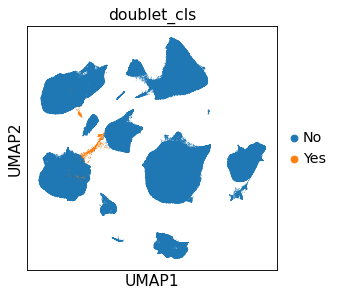

In [16]:
sc.pl.umap(adata2, use_raw=True, color=['doublet_cls'], size=2, wspace=0.2, ncols=5)

In [17]:
# remove doublet cluster
adata2 = adata2[adata2.obs['doublet_cls']=='No']

# save
# adata2.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdbl_rmdblcls.h5ad')

## rere-UMAP and Clustering

In [ ]:
adata2 = sc.read_h5ad(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdblcls.h5ad')
adata2

In [18]:
%%time
sc.pp.neighbors(adata2, use_rep="X_scVI")
sc.tl.umap(adata2, min_dist=0.2)
sc.tl.leiden(adata2, resolution=2, key_added='leiden_scVI',)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:04:25)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:14:07)
running Leiden clustering
    finished: found 49 clusters and added
    'leiden_scVI', the cluster labels (adata.obs, categorical) (0:29:45)


CPU times: user 1h 30min 27s, sys: 12min 58s, total: 1h 43min 26s
Wall time: 48min 18s


In [26]:
# save
adata2.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdblcls.h5ad')

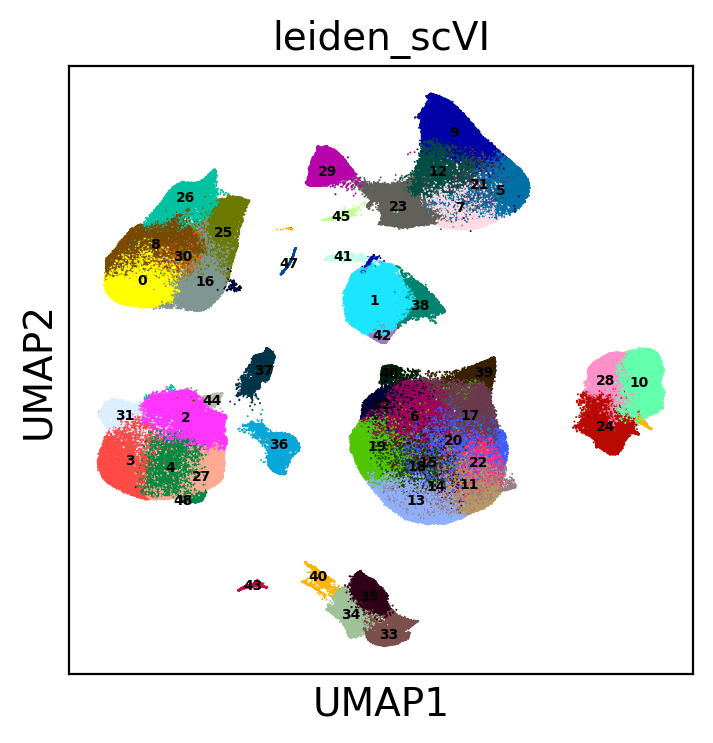

In [24]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata2, color=['leiden_scVI'], size=2, wspace=0.2, ncols=6, legend_loc='on data', legend_fontsize=5)

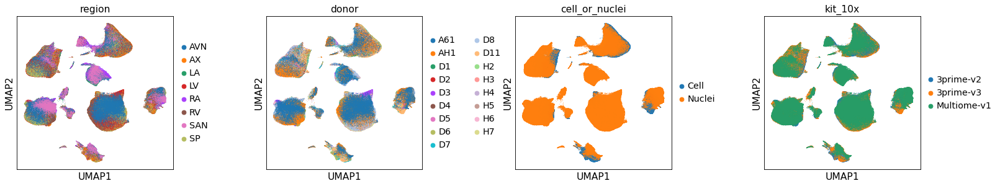

In [19]:
sc.pl.umap(adata2, color=['region','donor','cell_or_nuclei','kit_10x'], size=2, wspace=0.45)

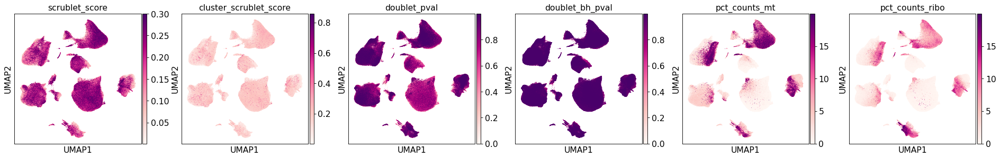

In [20]:
sc.pl.umap(adata2, color=['scrublet_score','cluster_scrublet_score','doublet_pval','doublet_bh_pval','pct_counts_mt','pct_counts_ribo'], size=2, wspace=0.2, ncols=6)

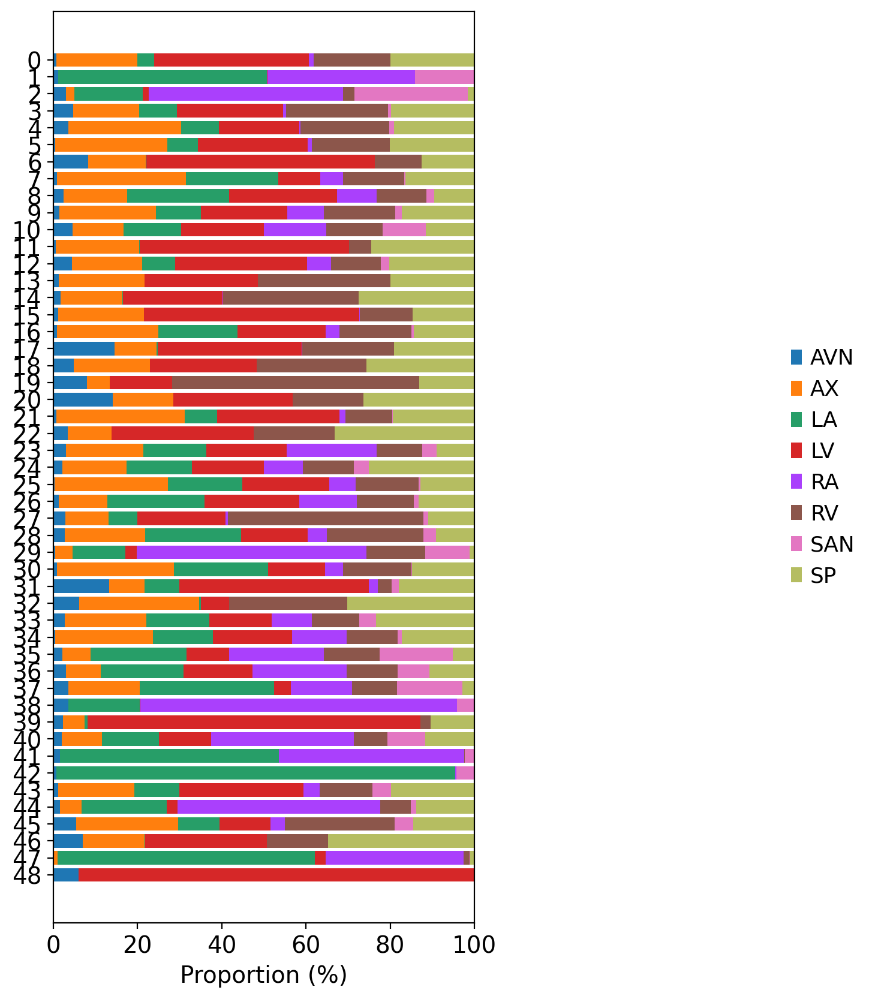

In [25]:
plt.rcParams['axes.grid'] = False
plt.rcParams['figure.figsize'] = 4.5,10
proportion(adata2, key='region', groupby='leiden_scVI', invert_yaxis=True, bbox_to_anchor=(1.95, 0.5))

In [ ]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)

## Cell type annotation

In [27]:
genename_column='gene_name_multiome-2'

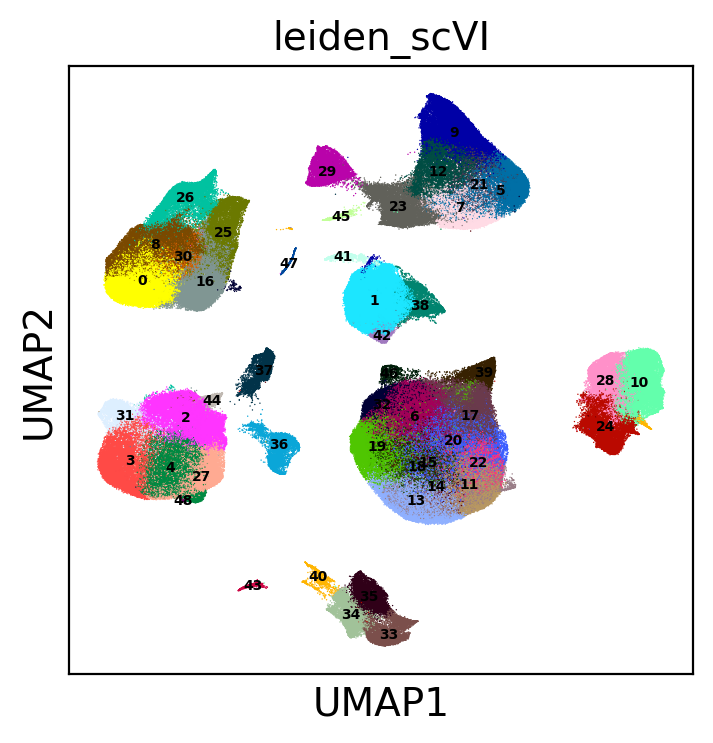

In [28]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata2, color=['leiden_scVI',], size=1, legend_loc='on data', legend_fontsize=5)

In [ ]:
%%time
sc.tl.rank_genes_groups(adata2, 'leiden_scVI', method='wilcoxon')

In [ ]:
adata2.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdbl_rmdblcls.h5ad')

In [ ]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)
sc.pl.rank_genes_groups(adata2, n_genes=25, sharey=False, gene_symbols=genename_column, ncols=6)

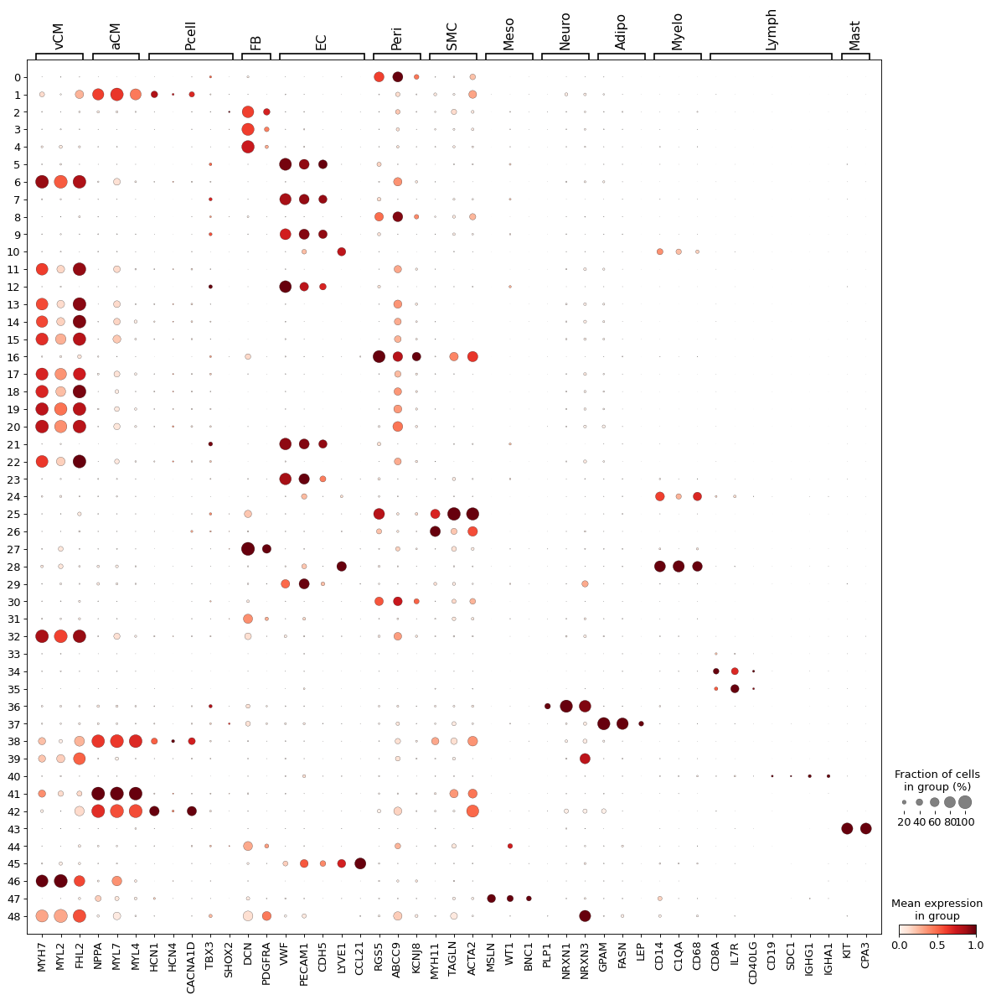

In [29]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'RdPu',)

marker_genes_dict = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for k, v in marker_genes_dict.items():
    marker_genes_dict[k] = [x for x in v if x in list(adata2.raw.var[genename_column])]

sc.pl.dotplot(adata2, marker_genes_dict, 
              groupby='leiden_scVI',
              dendrogram=False,
              use_raw=True,
              gene_symbols=genename_column,
              standard_scale="var",
              color_map="Reds",
             # swap_axes=True
             )

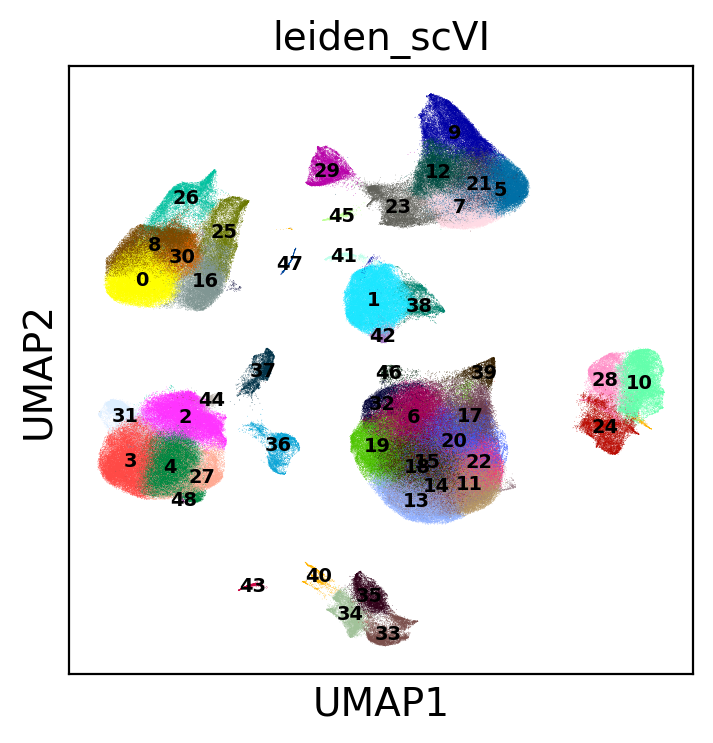

In [30]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata2, color=['leiden_scVI',], size=0.2, legend_loc='on data', legend_fontsize=7)

In [31]:
adata2.obs['cell_type']=adata2.obs['leiden_scVI'].astype('str').copy()
adata2.obs.replace({'cell_type':{
    '0':'Mural cell',#
    '1':'Atrial Cardiomyocyte',#
    '2':'Fibroblast',#
    '3':'Fibroblast',#
    '4':'Fibroblast',#
    '5':'Endothelial cell',#
    '6':'Ventricular Cardiomyocyte',#
    '7':'Endothelial cell',#
    '8':'Mural cell',#
    '9':'Endothelial cell',#
    '10':'Myeloid',#
    '11':'Ventricular Cardiomyocyte',#
    '12':'Endothelial cell',#
    '13':'Ventricular Cardiomyocyte',#
    '14':'Ventricular Cardiomyocyte',#
    '15':'Ventricular Cardiomyocyte',#
    '16':'Mural cell',#
    '17':'Ventricular Cardiomyocyte',#
    '18':'Ventricular Cardiomyocyte',#
    '19':'Ventricular Cardiomyocyte',#
    '20':'Ventricular Cardiomyocyte',#
    '21':'Endothelial cell',#
    '22':'Ventricular Cardiomyocyte',#
    '23':'Endothelial cell',#
    '24':'Myeloid',#
    '25':'Mural cell',#
    '26':'Mural cell',#
    '27':'Fibroblast',#
    '28':'Myeloid',#
    '29':'Endothelial cell',#
    '30':'Mural cell',#
    '31':'Fibroblast',#
    '32':'Ventricular Cardiomyocyte',#
    '33':'Lymphoid',#
    '34':'Lymphoid',#
    '35':'Lymphoid',#
    '36':'Neuronal cell',#
    '37':'Adipocyte',#
    '38':'Atrial Cardiomyocyte',#
    '39':'Ventricular Cardiomyocyte',#
    '40':'Lymphoid',#
    '41':'Atrial Cardiomyocyte',#
    '42':'Atrial Cardiomyocyte',#
    '43':'Mast cell',#
    '44':'Fibroblast',#
    '45':'Lymphatic Endothelial cell',#
    '46':'Ventricular Cardiomyocyte',#
    '47':'Mesothelial cell',#
    '48':'Fibroblast',#
}}, inplace=True)

adata2.obs['cell_type'].value_counts()

Ventricular Cardiomyocyte     186428
Endothelial cell              122741
Fibroblast                    106672
Mural cell                     99845
Atrial Cardiomyocyte           40543
Myeloid                        37439
Lymphoid                       21178
Neuronal cell                   5625
Adipocyte                       5166
Mast cell                       1524
Lymphatic Endothelial cell       984
Mesothelial cell                 896
Name: cell_type, dtype: int64

... storing 'cell_type' as categorical


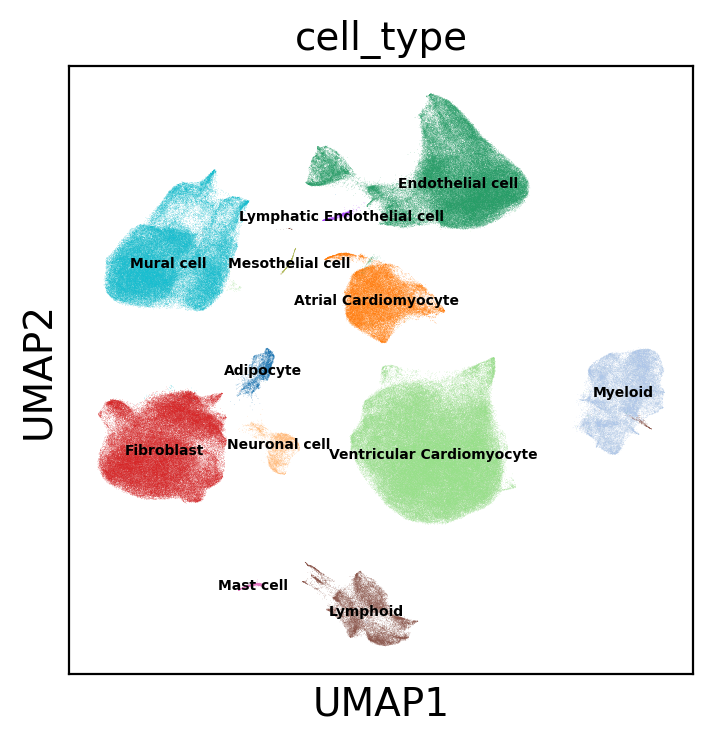

In [32]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata2, color=['cell_type'], size=0.1, legend_loc='on data', legend_fontsize=5)

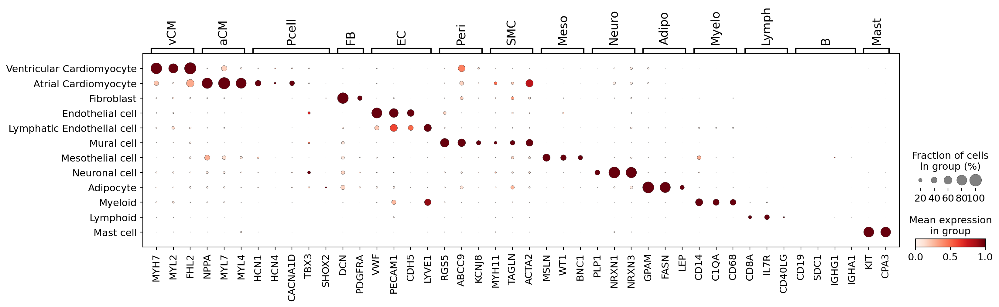

In [34]:
marker_genes_dict = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5','LYVE1'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for k, v in marker_genes_dict.items():
    marker_genes_dict[k] = [x for x in v if x in list(adata2.raw.var[genename_column])]

sc.pl.dotplot(adata2, marker_genes_dict, 
              groupby='cell_type',
              dendrogram=False,
              use_raw=True,
              gene_symbols=genename_column,
              categories_order=[
                  'Ventricular Cardiomyocyte',
                  'Atrial Cardiomyocyte',
                  'Fibroblast',
                  'Endothelial cell',
                  'Lymphatic Endothelial cell',
                  'Mural cell',
                  'Mesothelial cell',
                  'Neuronal cell',
                  'Adipocyte',
                  'Myeloid',
                  'Lymphoid',
                  
                  'Mast cell',
              ],
              standard_scale="var",
              color_map="Reds",
             # swap_axes=True
             )

In [35]:
adata2.write(f'{adata_dir}/scVI/RNA_adult-8reg_scVI_rmdblcls.h5ad')

## Reconstruct anndata with raw count and X_scVI

In [39]:
adata_raw=sc.read_h5ad(f'{adata_dir}/RNA_adult-8reg_raw.h5ad')

In [40]:
import anndata

adata_recon=anndata.AnnData(X=adata_raw[adata2.obs_names,:].X,
                      obs=adata2.obs, # from post-scVI data
                      var=adata_raw.var,
                      obsm=adata2.obsm, # from post-scVI data
                      obsp=adata2.obsp # from post-scVI data
                               )
adata_recon

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 629041 × 32732
    obs: 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'donor_physical', 'donor_predicted', 'batch_key', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'doublet_cls', 'cell_type'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

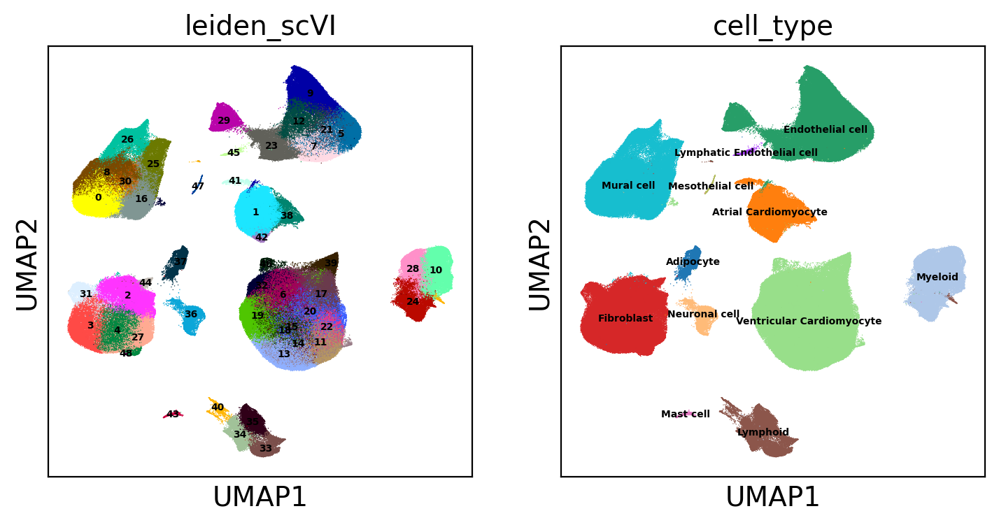

In [41]:
sc.pl.umap(adata_recon, color=['leiden_scVI','cell_type'], size=1, wspace=0.1, legend_loc='on data', legend_fontsize=5)

## Add HCA-v1 annotation

In [42]:
# read v1data
HCA=sc.read_h5ad('/nfs/team205/kk18/HeartAtlas/anndata/adult-heart_scnRNA-MultiRNA_raw_210720.h5ad')

In [43]:
len(HCA.obs['donor'].value_counts())

15

In [44]:
HCA.obs['modality'].value_counts()

3prime_v3    223208
3prime_v2    219796
Multiome      30639
Name: modality, dtype: int64

In [45]:
# extract annotation from 3-prime
HCA_3p_obs = HCA.obs[HCA.obs['modality'].isin(['3prime_v3','3prime_v2'])]

# whether all index contains '-1-'
all(['-1-' in x for x in HCA_3p_obs.index])

True

In [46]:
# replace '-1-' with '_'
HCA_3p_obs.index=[x.replace('-1-','_') for x in HCA_3p_obs.index]
HCA_3p_obs=HCA_3p_obs.reset_index().rename(columns={'index':'barcode_s'})
HCA_3p_obs

,barcode_s,sangerID,modality,donor,age_group,region,cell_or_nuclei,gender,type,cell_states
0,HCAHeart8287126_AAACCCAAGAGGATGA,HCAHeart8287126,3prime_v3,D11,60-65,RV,nuclei,Female,DCD,EC1_cap
1,HCAHeart8287126_AAACCCAAGCCTCTCT,HCAHeart8287126,3prime_v3,D11,60-65,RV,nuclei,Female,DCD,EC7_atria
2,HCAHeart8287126_AAACCCAAGGGTAATT,HCAHeart8287126,3prime_v3,D11,60-65,RV,nuclei,Female,DCD,PC3_str
3,HCAHeart8287126_AAACCCACAGTGTACT,HCAHeart8287126,3prime_v3,D11,60-65,RV,nuclei,Female,DCD,vCM1
4,HCAHeart8287126_AAACCCATCATGACAC,HCAHeart8287126,3prime_v3,D11,60-65,RV,nuclei,Female,DCD,vCM1
...,...,...,...,...,...,...,...,...,...,...
442999,HCAHeart7757637_TTGGCAACACATGACT,HCAHeart7757637,3prime_v2,D3,55-60,RV,nuclei,Male,DBD,vCM1
443000,HCAHeart7757637_TTTACTGCAAGCCTAT,HCAHeart7757637,3prime_v2,D3,55-60,RV,nuclei,Male,DBD,vCM2
443001,HCAHeart7757637_TTTACTGTCACAGGCC,HCAHeart7757637,3prime_v2,D3,55-60,RV,nuclei,Male,DBD,vCM1
443002,HCAHeart7757637_TTTACTGTCTTATCTG,HCAHeart7757637,3prime_v2,D3,55-60,RV,nuclei,Male,DBD,vCM1


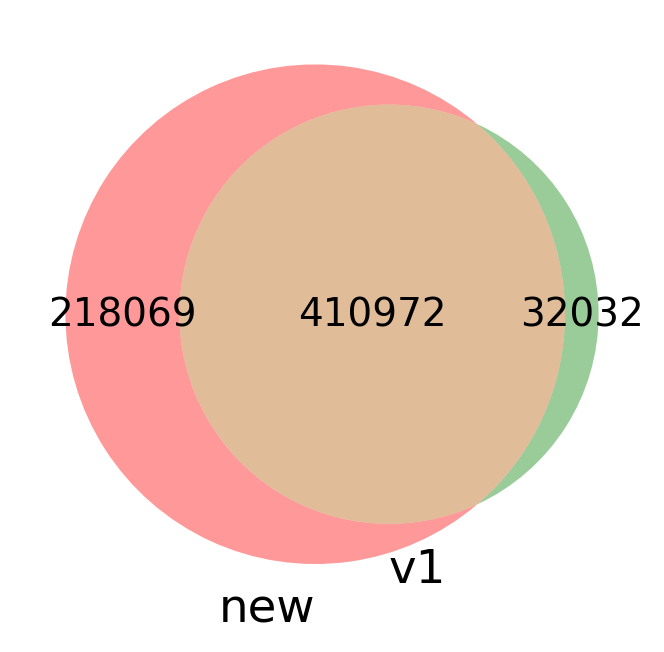

In [47]:
from matplotlib_venn import venn2
adata_recon.obs['barcode_s']=[x.replace('-1','') for x in adata_recon.obs_names]
venn2([set(adata_recon.obs['barcode_s']), set(HCA_3p_obs['barcode_s'])], ('new', 'v1'))

In [48]:
## ADD
adata_recon.obs = adata_recon.obs.reset_index().merge(HCA_3p_obs[['barcode_s','cell_states']], how='left', on='barcode_s').set_index('barcode')

# rename column name
adata_recon.obs.rename(columns={'cell_states':'cell_state_HCAv1'},inplace=True)
adata_recon.obs

,latent_RT_efficiency,latent_cell_probability,latent_scale,sangerID,combinedID,donor,donor_type,region,region_finest,age,...,donor_physical,donor_predicted,batch_key,_scvi_batch,_scvi_labels,leiden_scVI,doublet_cls,cell_type,barcode_s,cell_state_HCAv1
barcode,,,,,,,,,,,,,,,,,,,,,
HCAHeart7606896_GATGAGGCACGGCTAC,8.281336,0.976983,615.699524,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,...,D1,nan,D1_Cell_3prime-v2,2,0,21,No,Endothelial cell,HCAHeart7606896_GATGAGGCACGGCTAC,EC5_art
HCAHeart7606896_CGCTTCACATTTGCCC,6.679333,0.974092,611.140320,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,...,D1,nan,D1_Cell_3prime-v2,2,0,25,No,Mural cell,HCAHeart7606896_CGCTTCACATTTGCCC,SMC2_art
HCAHeart7606896_GTTAAGCAGAGACTAT,7.455478,0.995780,472.459595,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,...,D1,nan,D1_Cell_3prime-v2,2,0,9,No,Endothelial cell,HCAHeart7606896_GTTAAGCAGAGACTAT,EC5_art
HCAHeart7606896_TCGCGTTGTAAGAGGA,6.130729,0.999913,408.569458,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,...,D1,nan,D1_Cell_3prime-v2,2,0,16,No,Mural cell,HCAHeart7606896_TCGCGTTGTAAGAGGA,PC2_atria
HCAHeart7606896_GCTGCGAGTGTTGGGA,6.257358,0.999569,468.770172,HCAHeart7606896,na,D1,DBD,AX,AX,50-55,...,D1,nan,D1_Cell_3prime-v2,2,0,9,No,Endothelial cell,HCAHeart7606896_GCTGCGAGTGTTGGGA,EC5_art
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCAHeartST11350187_HCAHeartST11121845_CAAGTGAAGTATTGTG-1,1.241419,0.932249,735.729187,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,A61,DCD,SAN,SAN MID,nan,...,AH1-A61,A61,A61_Nuclei_Multiome-v1,0,0,2,No,Fibroblast,HCAHeartST11350187_HCAHeartST11121845_CAAGTGAA...,NaN
HCAHeartST11350187_HCAHeartST11121845_ATCCGTGAGGCACAGG-1,1.172026,0.977718,1267.559082,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,A61,DCD,SAN,SAN MID,nan,...,AH1-A61,A61,A61_Nuclei_Multiome-v1,0,0,12,No,Endothelial cell,HCAHeartST11350187_HCAHeartST11121845_ATCCGTGA...,NaN
HCAHeartST11350187_HCAHeartST11121845_AGTAGCTTCATGAGCT-1,1.162758,0.965302,1255.048096,HCAHeartST11350187,HCAHeartST11350187_HCAHeartST11121845,AH1,DCD,SAN,SAN MID,nan,...,AH1-A61,AH1,AH1_Nuclei_Multiome-v1,1,0,2,No,Fibroblast,HCAHeartST11350187_HCAHeartST11121845_AGTAGCTT...,NaN


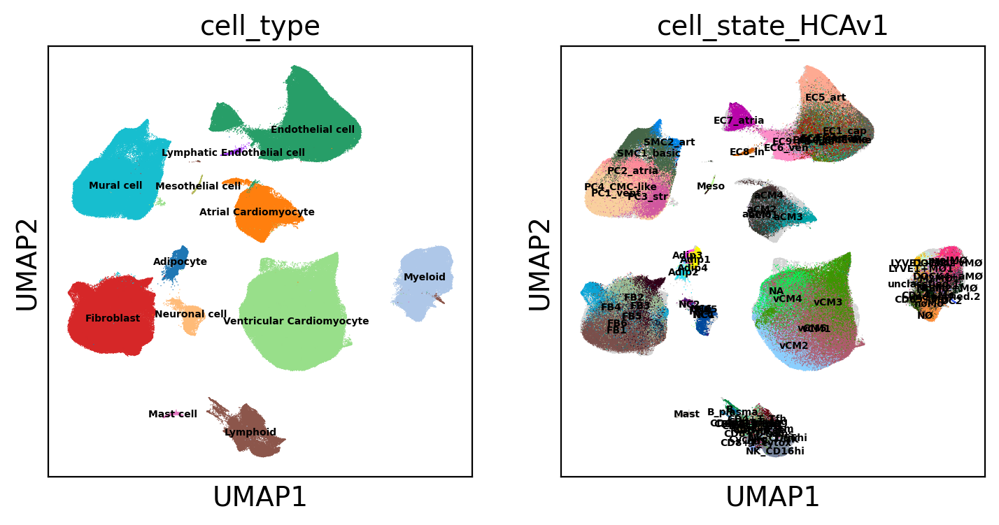

In [49]:
sc.settings.set_figure_params(dpi=200, facecolor='white', color_map = 'RdPu',)
sc.pl.umap(adata_recon, color=['cell_type','cell_state_HCAv1'], size=1, wspace=0.1, legend_loc='on data', legend_fontsize=5)

## Save

In [51]:
# select columns
adata_recon.obs=adata_recon.obs[['sangerID', 'combinedID', 'donor', 'donor_type', 'region',
       'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei',
       'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts',
       'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo',
       'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden',
       'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval',
       'batch_key','leiden_scVI','cell_type','cell_state_HCAv1']]

adata_recon

AnnData object with n_obs × n_vars = 629041 × 32732
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2'
    uns: 'leiden_scVI_colors', 'cell_type_colors', 'cell_state_HCAv1_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    obsp: 'connectivities', 'distances'

In [52]:
# set category orders
adata_recon.obs['cell_type'].cat.reorder_categories([
                    'Ventricular Cardiomyocyte',
                  'Atrial Cardiomyocyte',
                  'Fibroblast',
                  'Endothelial cell',
                'Lymphatic Endothelial cell',
                  'Mural cell',
                  'Mesothelial cell',
                  'Neuronal cell',
                  'Adipocyte',
                  'Myeloid',
                  'Lymphoid',
                  'Mast cell',          
                 ],inplace=True)

adata_recon.obs['region'].cat.reorder_categories([
                    'SAN',
                    'AVN',
                'RA','LA','RV','LV','SP','AX'
                 ],inplace=True)

In [53]:
adata_recon.write(f'{adata_dir}/RNA_adult-8reg_raw_rmdblcls_celltype-annotated.h5ad')

/home/jovyan/my-conda-envs/cellpymc/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


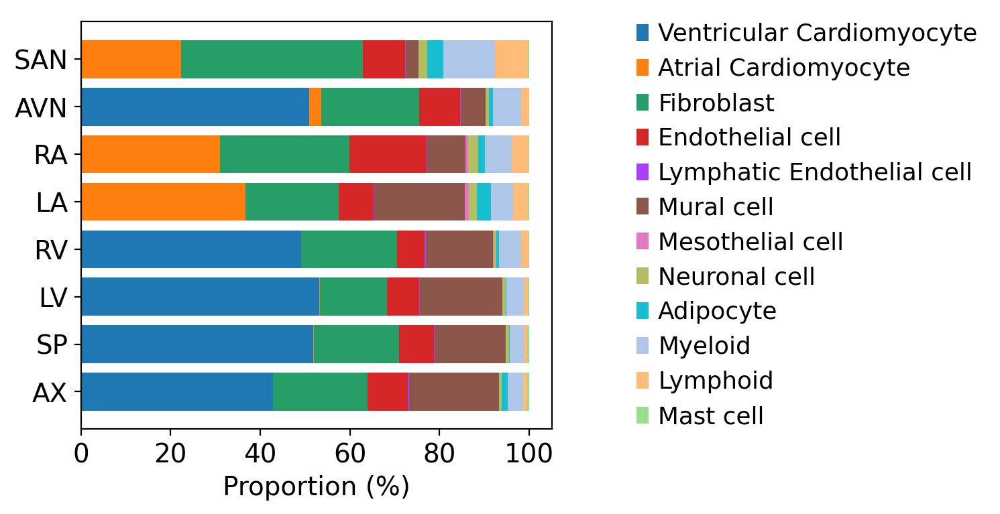

In [54]:
# proportion using only nuclei
nuc=adata_recon[adata_recon.obs['cell_or_nuclei']=='Nuclei']

plt.rcParams['axes.grid'] = False
plt.rcParams['figure.figsize'] = 4.5,4
proportion(nuc, key='cell_type', groupby='region', invert_yaxis=True, bbox_to_anchor=(1.95, 0.5))

In [ ]:
a = sc.read_h5ad(f'{adata_dir}/RNA_adult-8reg_raw_rmdbl_rmdblcls_celltype-annotated.h5ad')

In [ ]:
a[a.obs['kit_10x']=='5prime-v2'].obs['sangerID'].value_counts()

In [ ]:
a.obs['kit_10x'].value_counts()

In [ ]:
a.obs[a.obs['kit_10x']=='Multiome-v1']['region'].value_counts()

In [ ]:
a.obs['region'].value_counts()

In [ ]:
a.obs['donor'].value_counts()

In [ ]:
len(set(a.obs['sangerID']))

In [ ]:
len(set(a.obs['donor']))

In [ ]:
len(a)